# *deepBreaks* applications
## Novel insights of niche associations in the oral microbiome   
In this study we are trying to use 1006 nucleotide sequences to train predictive models for predicting a niches of Haemophilus parainfluenzae which in this study are tongue dorsum, buccal mucosa, and supragingival plaque.  
After that, we use the top 3 models to study their feature importances and merge their results. We cover all three steps of preprocessing, modelling, and interpretaion of the models. Finally we vizualize the results of the models and prioritize the most imposrtant sites of the sequences.
<p style="text-align:center;">
<figure>
  <img src="../img/hmp/fig1.png" alt="Niches" style="width: 400px;">
    <figcaption>Image from: <a size=10 href=https://doi.org/10.1038/nature23889>Lloyd-Price, J., Mahurkar, A., Rahnavard, G. et al. Strains, functions and dynamics in the expanded Human Microbiome Project. Nature 550, 61–66 (2017)</a> 
        </figcaption>
</figure>
</p>

In [1]:
# importing deepBreaks libraries 
from deepBreaks.utils import get_models, get_scores, get_params, make_pipeline, df_to_dict,\
imp_print, ref_id_type, report_test_scores, train_test_split
from deepBreaks.preprocessing import MisCare, ConstantCare, URareCare, CustomOneHotEncoder
from deepBreaks.preprocessing import FeatureSelection, CollinearCare, CustomStandardScaler
from deepBreaks.preprocessing import read_data, balanced_classes
from deepBreaks.models import model_compare_cv, finalize_top, importance_from_pipe, mean_importance, summarize_results
from deepBreaks.visualization import plot_scatter, dp_plot, plot_imp_model, plot_imp_all, visualize_reg, visualize_cl
import warnings
import datetime
import os

In [2]:
warnings.filterwarnings("ignore")
warnings.simplefilter('ignore')

In [3]:
# defining user params, file pathes, analysis type

# path to sequences
seqFileName = '../../deepBreaks_data/hmp/s__Haemophilus_parainfluenzae.tsv'

# path to metadata
metaDataFileName = '../../deepBreaks_data/hmp/my_HMP_metadata.tsv'

# name of the phenotype
mt = 'Body_site'

# type of the sequences
seq_type = 'nu'
# type of the analysis if it is a classification model, then we put cl instead of reg
ana_type = 'cl'
sampleFrac=1
test_size = 0.2
seed = 123

In [4]:
# making a unique directory for saving the reports of the analysis
print('direcory preparation')
dt_label = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
seqFile = seqFileName.split('.')[0]
report_dir = str(seqFile +'_' + mt + '_' + dt_label)
os.makedirs(report_dir)

direcory preparation


In [5]:
%%time
# importing sequences data
print('reading meta-data')
# importing metadata
meta_data = read_data(metaDataFileName, seq_type = None, is_main=False)

# importing sequences data
print('reading fasta file')
tr = read_data(seqFileName, seq_type = seq_type, is_main=True, gap_threshold=0.7)

# selecting only the classes with enough number of samples
tr = balanced_classes(dat=tr, meta_dat=meta_data, feature=mt)

tr = tr.merge(meta_data.loc[:, mt],  left_index=True, right_index=True, how='inner')

# sequence data in dictionary format
raw_seq = df_to_dict(tr)
print('Shape of data is: ', tr.shape)

reading meta-data
reading fasta file
Columns with missing values over the gap_threshold% will be dropped and eliminate from the analysis during preprocessing.Please use the missing_constant_care function to take care of missing values.
Shape of data is:  (1006, 49840)
CPU times: user 58.6 s, sys: 4.81 s, total: 1min 3s
Wall time: 1min 5s


In [6]:
tr.shape

(1006, 49840)

**Attention**: metadata and sequences data should have the names as their row names and for each sequence their must be a value in the meta data file.

In [7]:
print('metadata looks like this:')
meta_data.head()

metadata looks like this:


,Body_area,Body_site,Gender
SRS011061,Gut,Stool,Female
SRS011084,Gut,Stool,Male
SRS011086,Oral,Tongue_dorsum,Female
SRS011090,Oral,Buccal_mucosa,Female
SRS011098,Oral,Supragingival_plaque,Female


In [8]:
print('sequence data looks like this:')
tr.head()

sequence data looks like this:


,p1,p2,p3,p4,p5,p6,p7,p8,p9,p10,...,p49831,p49832,p49833,p49834,p49835,p49836,p49837,p49838,p49839,Body_site
SRS076951,A,T,T,T,G,C,A,A,C,A,...,T,A,T,T,T,C,A,T,C,Tongue_dorsum
SRS019348,A,T,T,T,G,C,A,A,C,A,...,T,A,T,T,T,C,A,T,C,Tongue_dorsum
SRS053854,A,T,T,T,G,C,A,A,C,A,...,T,A,T,T,T,C,A,T,C,Tongue_dorsum
SRS104830,A,T,T,T,G,C,A,A,C,A,...,T,A,T,T,T,C,A,T,C,Tongue_dorsum
SRS015762,A,T,T,T,G,C,A,A,C,A,...,T,A,T,T,T,C,A,T,C,Tongue_dorsum


In [9]:
tr, test_df, y, y_test = train_test_split(dat=tr, meta_name=mt,
                                          test_size=test_size, random_state=seed)
print('Shape of train data is: ', tr.shape)
print('Shape of test data is: ', test_df.shape)

Shape of train data is:  (805, 49839)
Shape of test data is:  (201, 49839)


In [10]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)
print(le.classes_)

['Buccal_mucosa' 'Supragingival_plaque' 'Tongue_dorsum']


### Preprocessing
In this step, we do all these steps:
1. dropping columns with a number of missing values above a certain threshold  
2. dropping zero entropy columns  
3. imputing missing values with the mode of that column  
4. replacing cases with a frequency below a threshold (default 1.5%) with the mode of that column
5. dropping zero entropy columns
6. use statistical tests (each position against the phenotype) and drop columns with p-values below a threshold (default 0.25)
7. one-hot encode the remaining columns
8. calculate the pair-wise distance matrix for all of the columns
9. use the distance matrix for DBSCAN and cluster the correlated positions together
10. keep only one column (closes to center of each cluster) for each group and drop the rest from the training data set

In [11]:
prep_pipeline = make_pipeline(
    steps=[
        ('mc', MisCare(missing_threshold=0.05, gap_threshold=0.7)),
        ('cc', ConstantCare()),
        ('ur', URareCare(threshold=0.05)),
        ('cc2', ConstantCare()),
        ('one_hot', CustomOneHotEncoder()),
        ('feature_selection', FeatureSelection(model_type=ana_type, alpha=0.25, keep=True)),
        ('st_sc', CustomStandardScaler()),
        ('collinear_care', CollinearCare(dist_method='correlation', threshold=0.25, keep=True))
    ])

In [12]:
%%time
report, top = model_compare_cv(X=tr, y=y, preprocess_pipe=prep_pipeline,
                               models_dict=get_models(ana_type=ana_type),
                               scoring=get_scores(ana_type=ana_type),
                               report_dir=report_dir, random_state=seed,
                               cv=0.25, ana_type=ana_type, cache_dir=report_dir)

Fitting rf...
Fitting Adaboost...
Fitting et...
Fitting lg...
Fitting gbc...
Fitting dt...
Fitting xgb...
Fitting lgbm...
CPU times: user 14.3 s, sys: 15.2 s, total: 29.5 s
Wall time: 41min 17s


In [13]:
report

,Accuracy,AUC,F1,Recall,Precision
gbc,0.896040,0.961470,0.882546,0.881894,0.883377
rf,0.886139,0.953133,0.871067,0.871516,0.871042
xgb,0.886139,0.953659,0.869723,0.868357,0.871759
lgbm,0.876238,0.962137,0.856412,0.853958,0.862092
et,0.871287,0.946444,0.852997,0.852285,0.853997
lg,0.871287,0.951452,0.852125,0.850706,0.854546
Adaboost,0.792079,0.928066,0.778872,0.786318,0.795802
dt,0.782178,0.827368,0.760873,0.760715,0.761286


In [14]:
%%time
top = finalize_top(X=tr, y=y, top_models=top, grid_param={},report_dir=report_dir, cv=10, random_state=seed)

Tuning gbc...
Tuning rf...
Tuning xgb...
CPU times: user 8min 34s, sys: 17.3 s, total: 8min 51s
Wall time: 8min 55s


In [15]:
y_test_num = le.transform(y_test)

test_metrics = report_test_scores(model=top, X=test_df, y_true=y_test_num,
                                  ana_type=ana_type,
                                  report_dir=report_dir)
test_metrics.head()

,Accuracy,AUC,F1,Recall,Precision
gbc,0.890547,0.964789,0.867366,0.865657,0.870044
rf,0.880597,0.960525,0.857359,0.856197,0.862683
xgb,0.880597,0.965509,0.860511,0.860960,0.860424


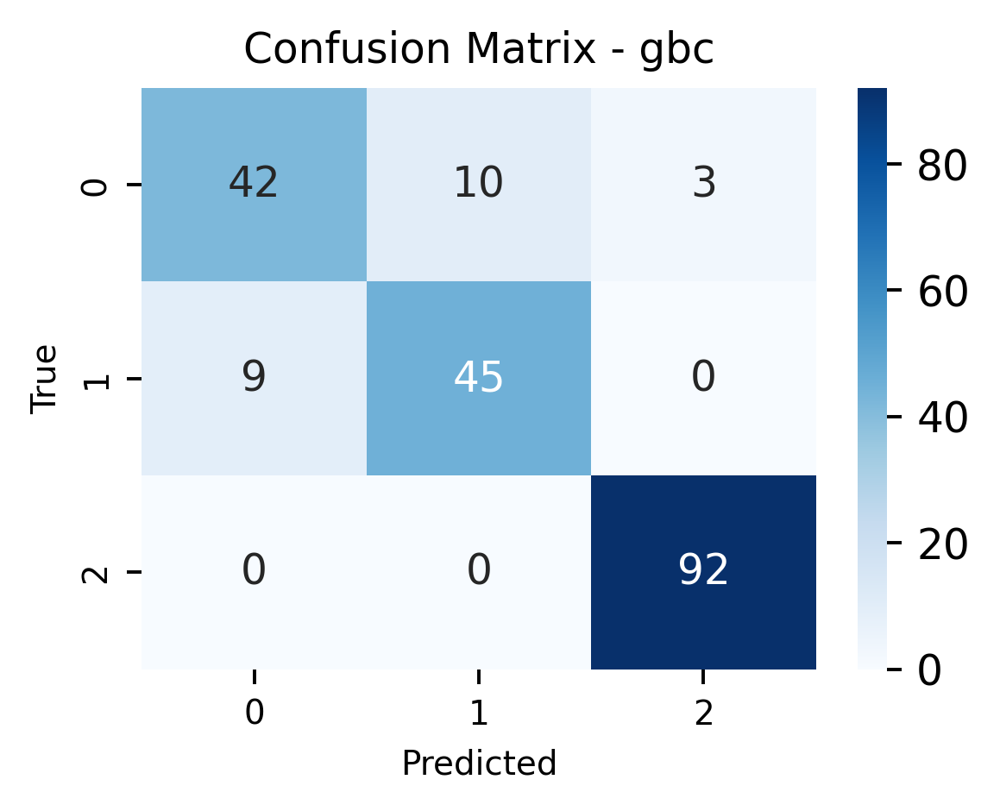

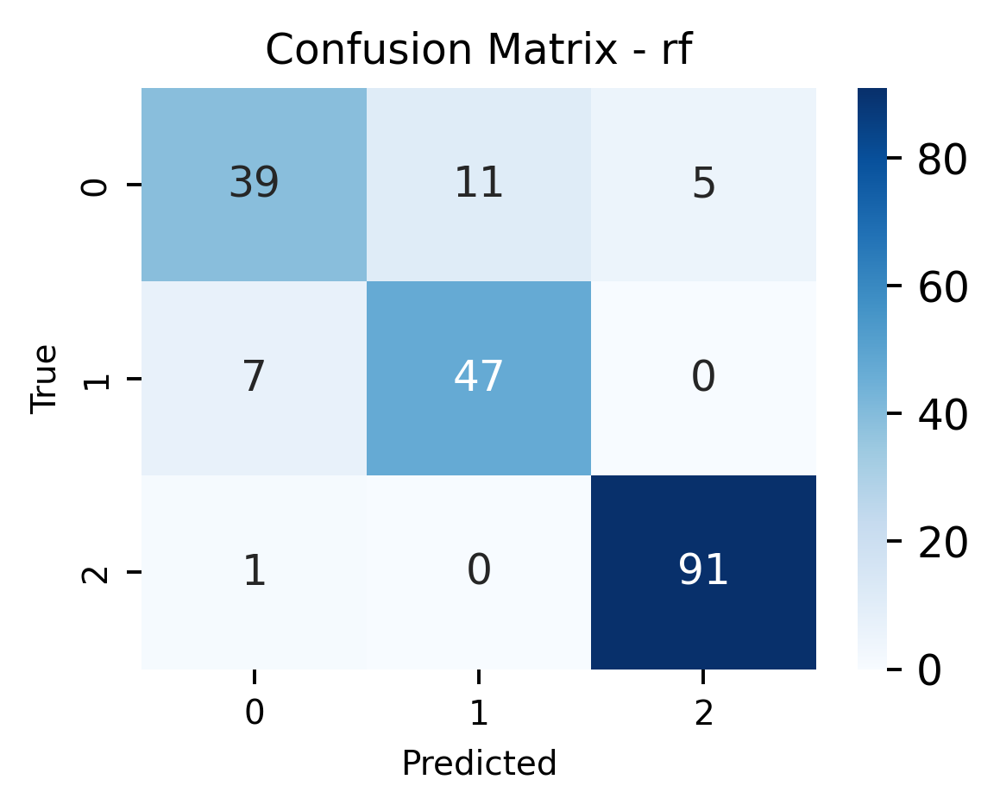

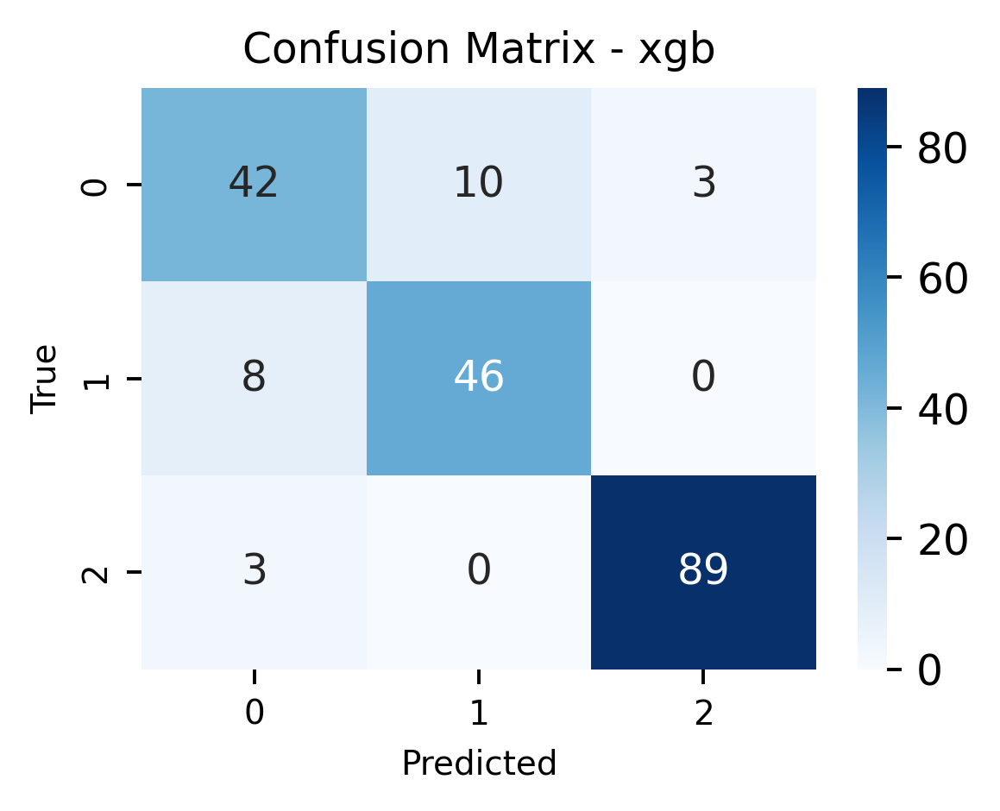

In [16]:
for model in top:
    y_pred = model.predict(test_df)
    y_pred = le.inverse_transform(y_pred)
    
    visualize_cl(y_true=y_test, y_pred=y_pred, model_name=model.steps[-1][0], report_dir=report_dir)

In [18]:
%%time
sr = summarize_results(top_models=top, report_dir=report_dir)

CPU times: user 3min 15s, sys: 2.09 s, total: 3min 17s
Wall time: 3min 23s


In [19]:
sr.head()

,feature,p_value,score,gbc,rf,xgb,mean
0,p1_N,0.002179,12.258046,0.0,0.020834,0.0,0.006945
1,p2_T,0.310494,2.339183,0.0,0.000000,0.0,0.000000
2,p3_T,0.310494,2.339183,0.0,0.000000,0.0,0.000000
3,p4_N,0.005046,10.578149,0.0,0.020834,0.0,0.006945
4,p4_T,0.139964,3.932736,0.0,0.006130,0.0,0.002043


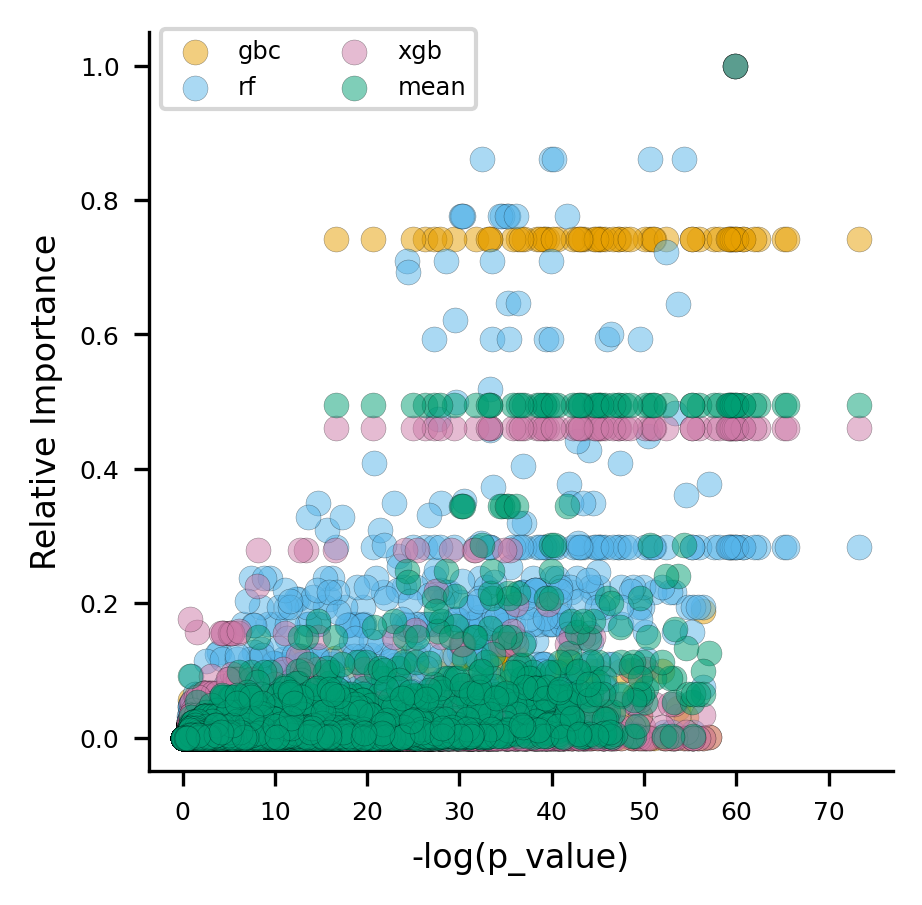

In [20]:
scatter_plot = plot_scatter(summary_result=sr, report_dir=report_dir)

In [21]:
%%time
mean_imp = mean_importance(top, report_dir=report_dir, aggregate_function='max')

CPU times: user 2.79 s, sys: 27.7 ms, total: 2.82 s
Wall time: 2.83 s


mean Done


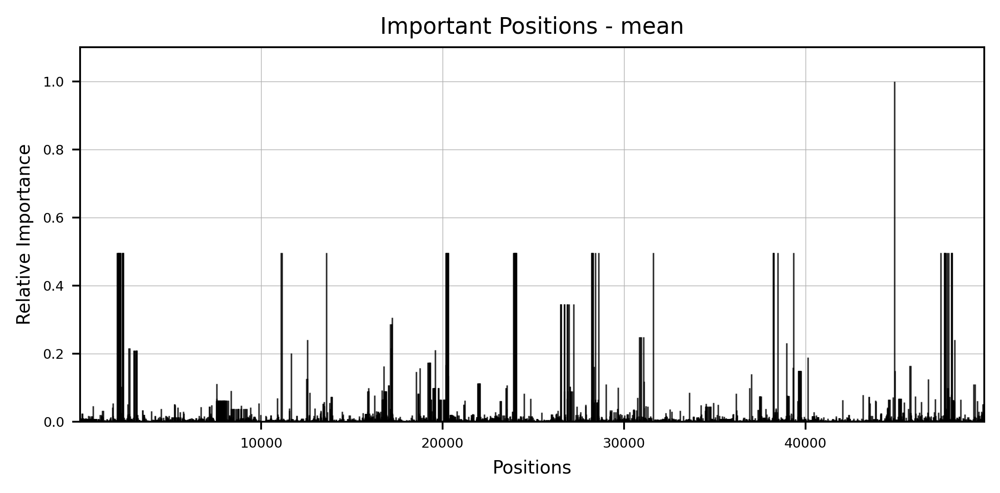

In [22]:
dp_plot(importance=mean_imp,imp_col='mean', model_name='mean', report_dir=report_dir, annotate=0)

In [23]:
tr = prep_pipeline[:4].fit_transform(tr)
y = le.inverse_transform(y)

gbc Done
gbc  Done
rf Done
rf  Done
xgb Done
xgb  Done


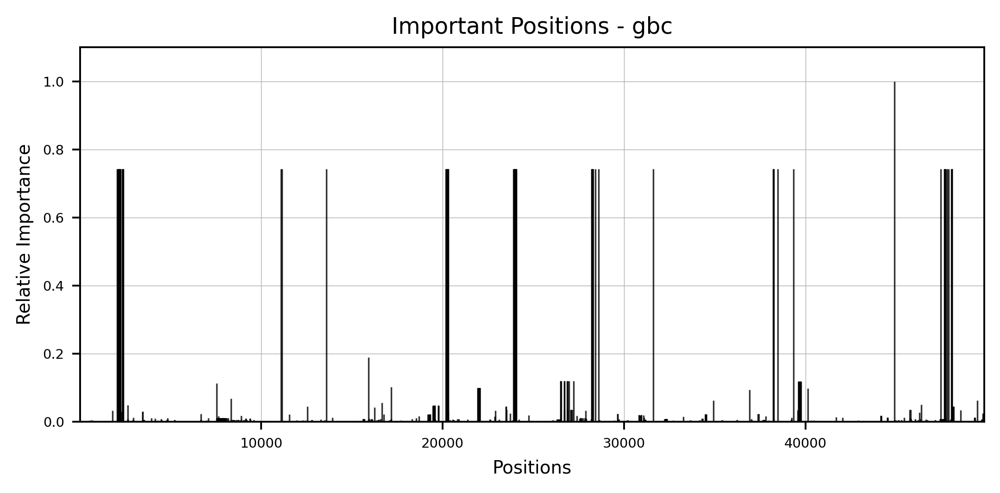

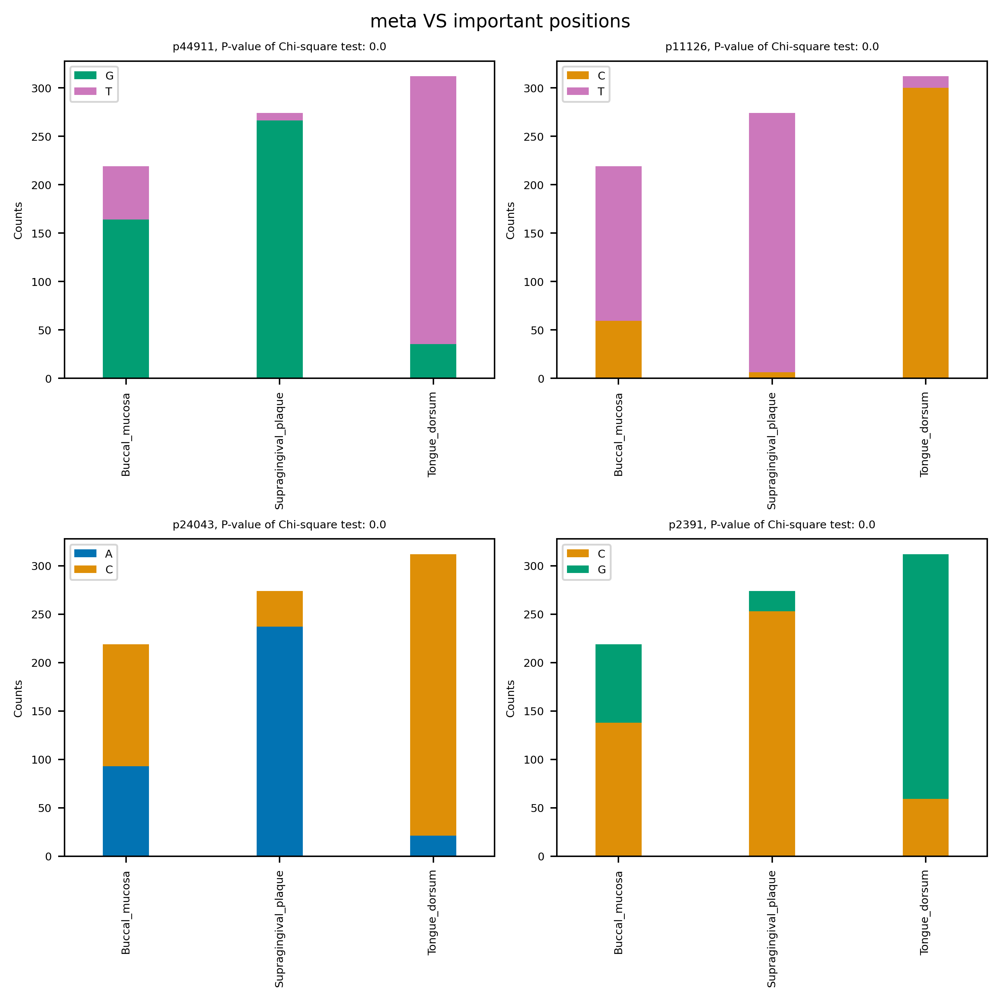

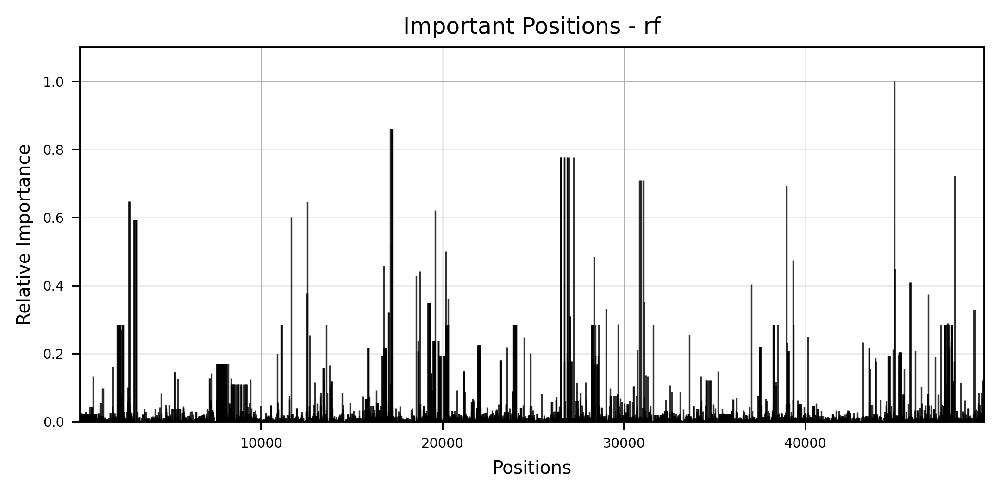

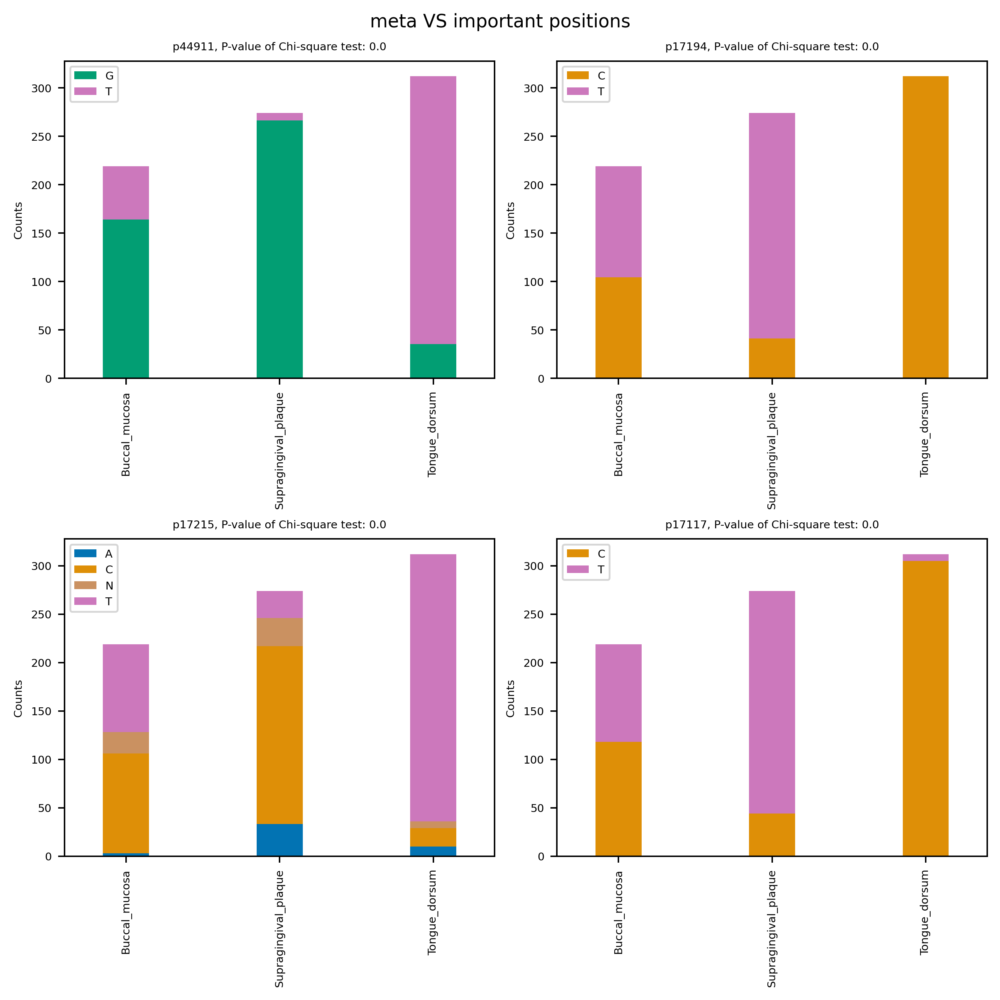

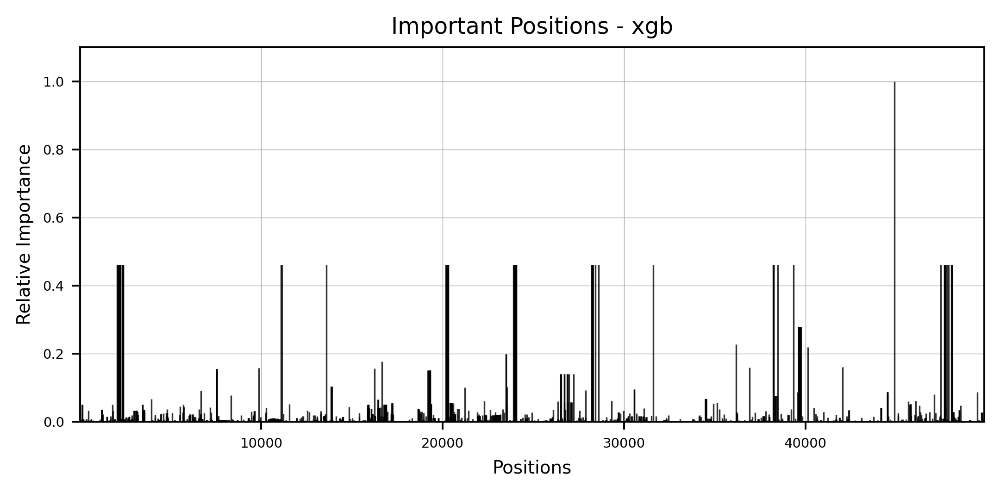

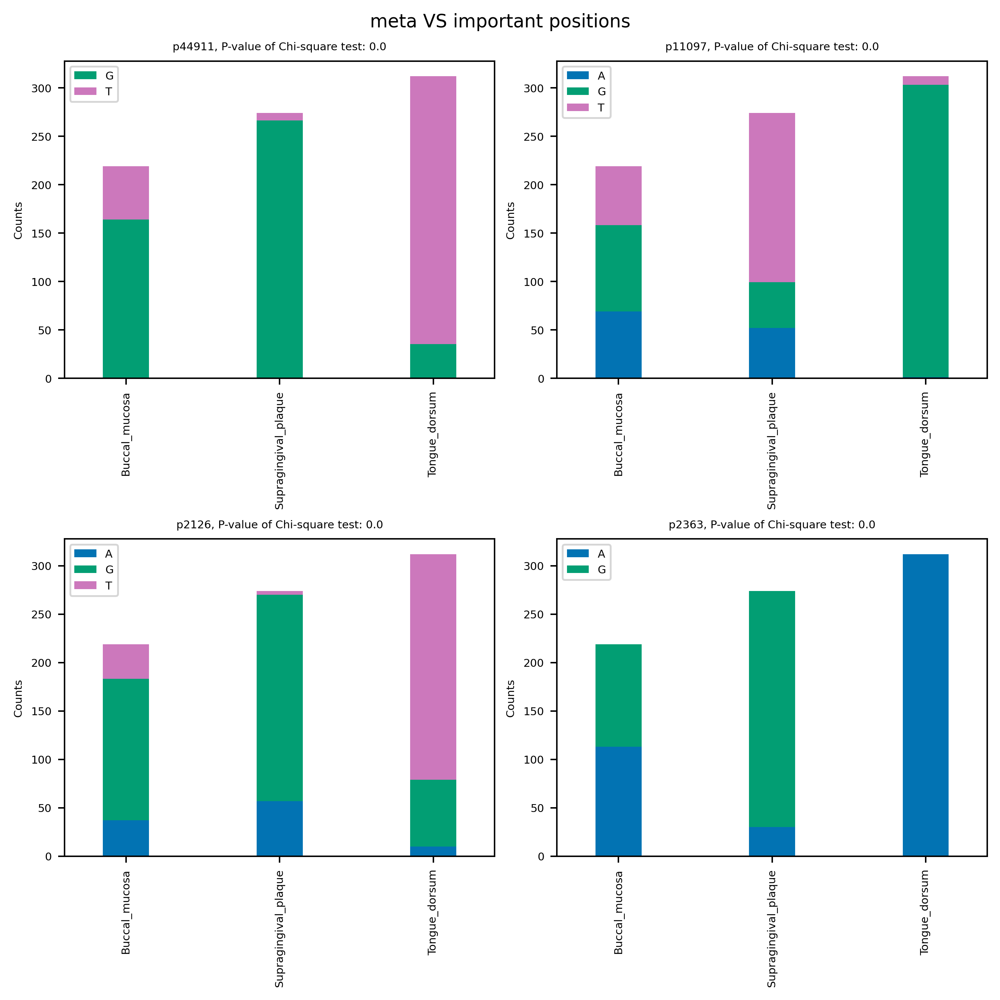

In [24]:
for model in top:
    model_name = model.steps[-1][0]
    dp_plot(importance=importance_from_pipe(model, aggregate_function='max'),
            annotate=0,
            imp_col='standard_value',
            model_name = model_name, report_dir=report_dir)
    
    plot_imp_model(importance=importance_from_pipe(model, aggregate_function='max'), 
               X_train=tr, y_train=y, model_name=model_name,
                   meta_var='meta', model_type=ana_type, report_dir=report_dir)

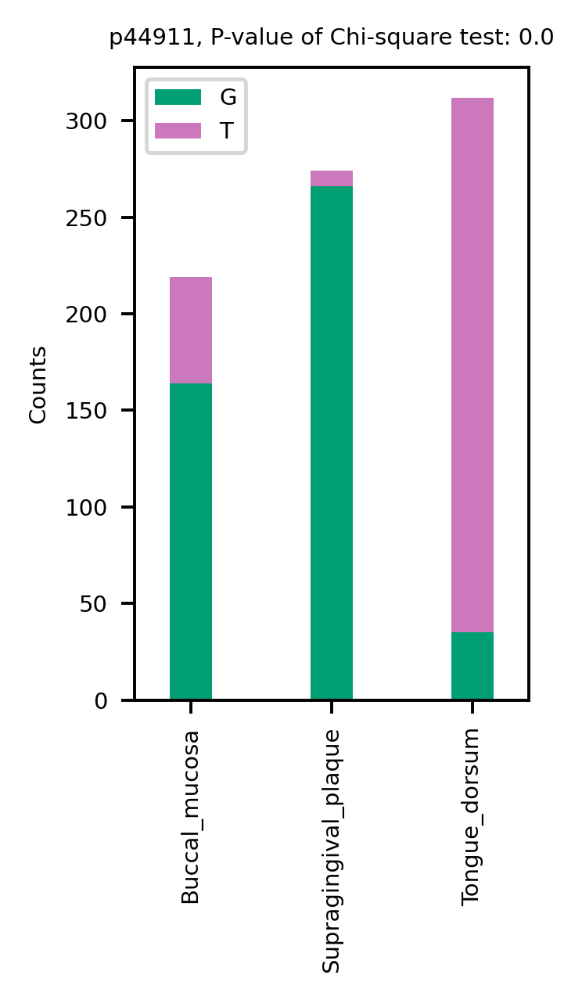

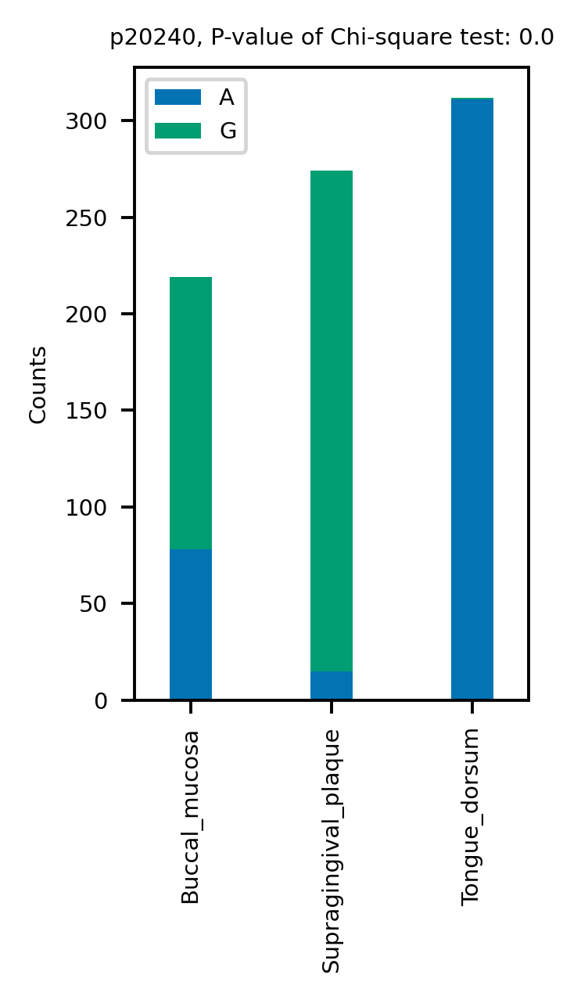

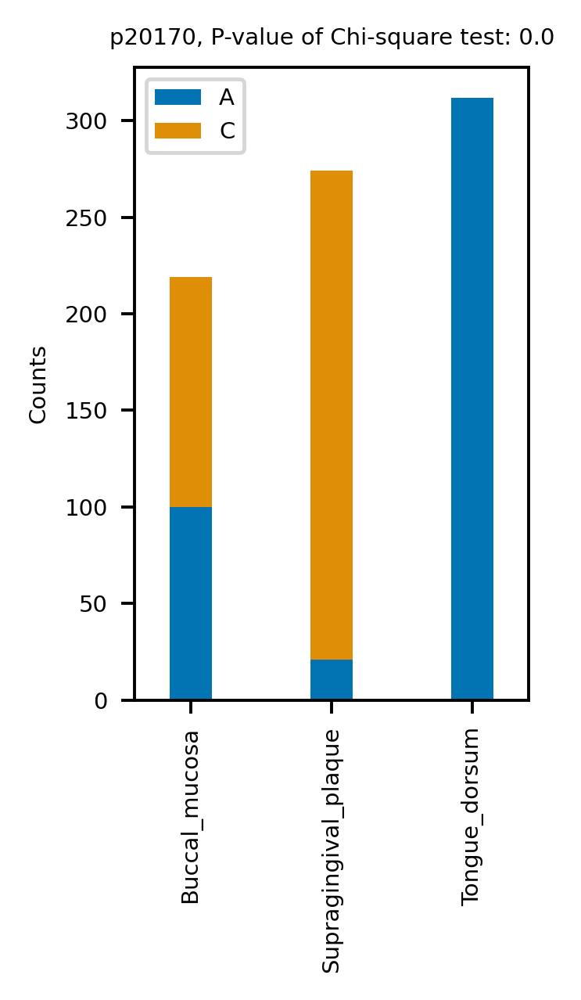

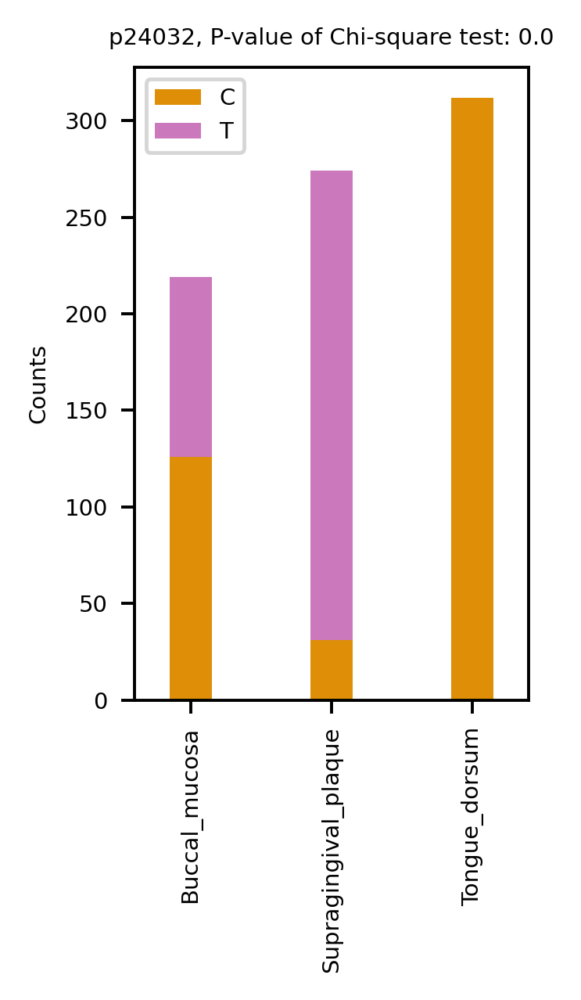

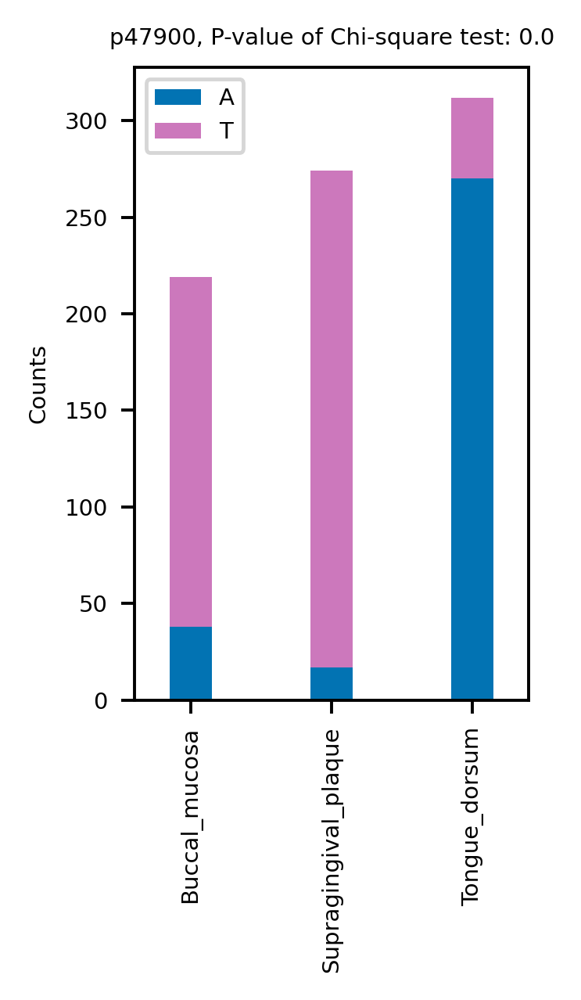

...

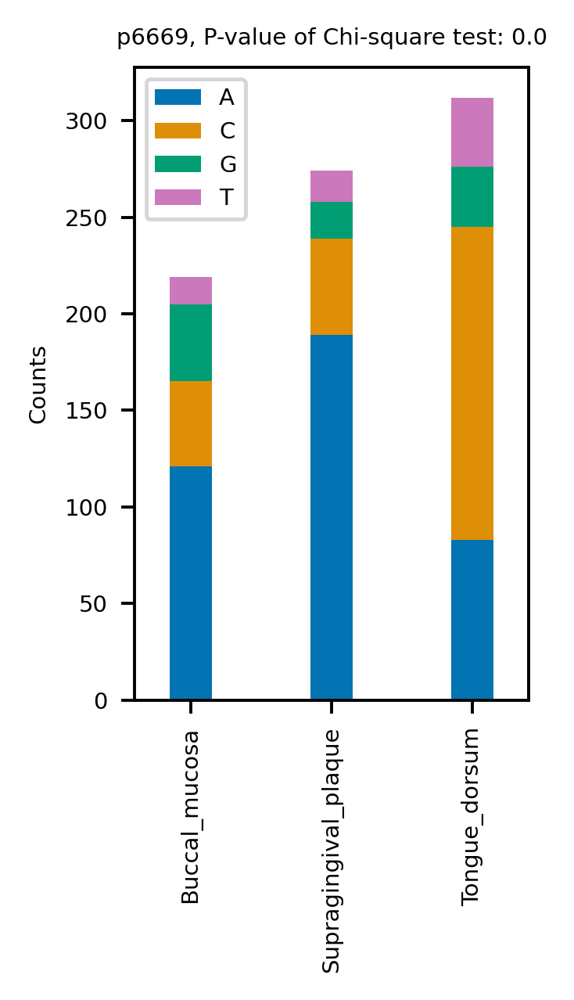

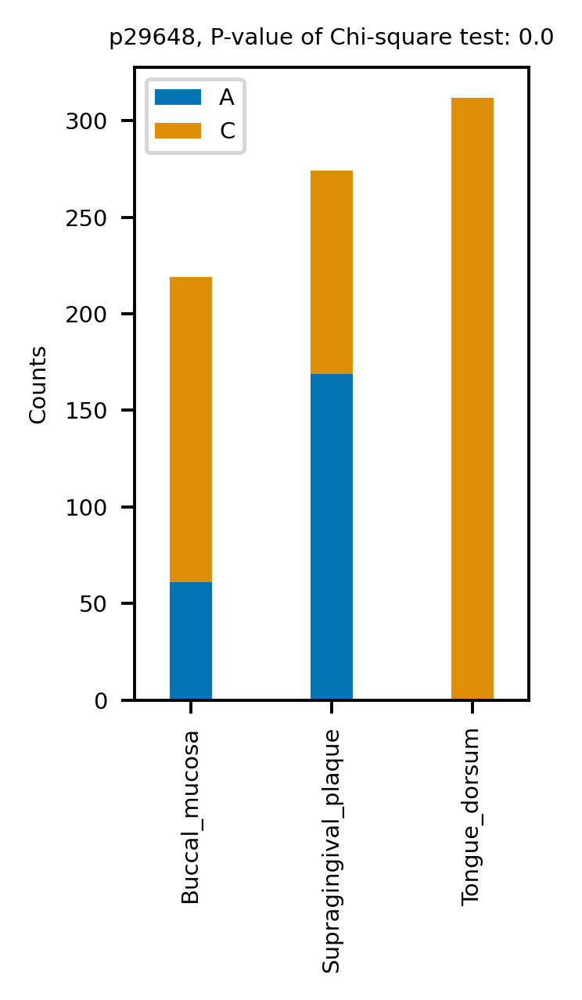

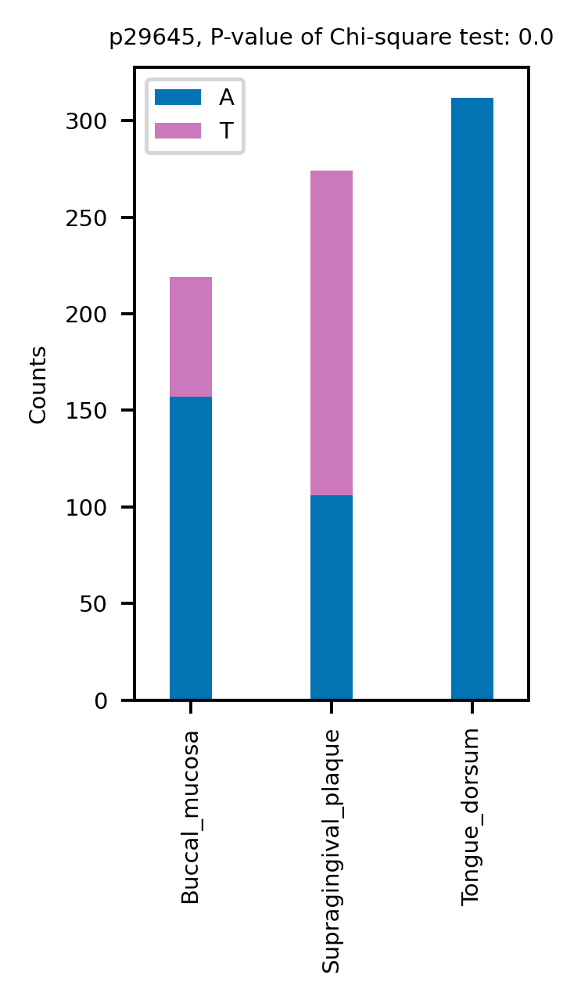

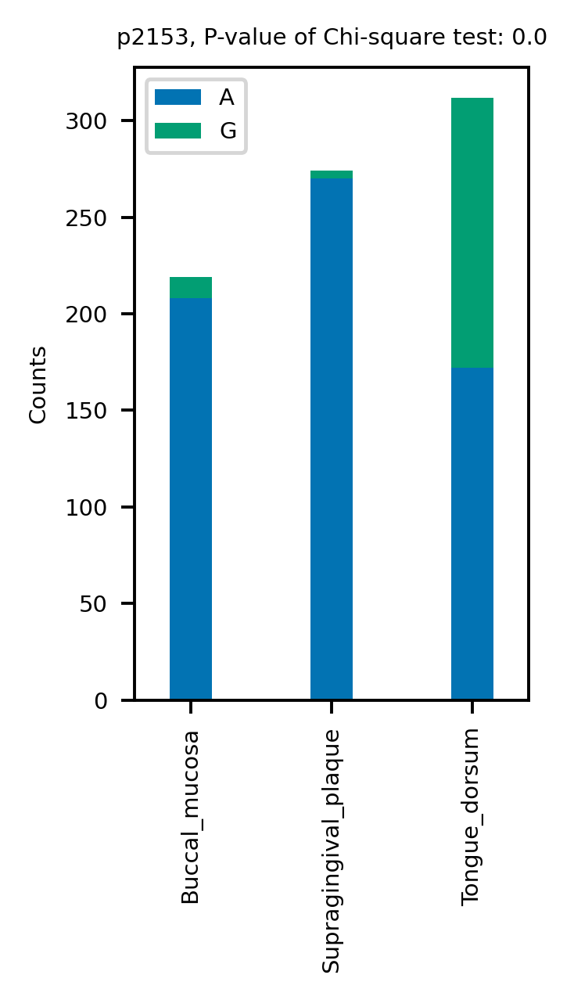

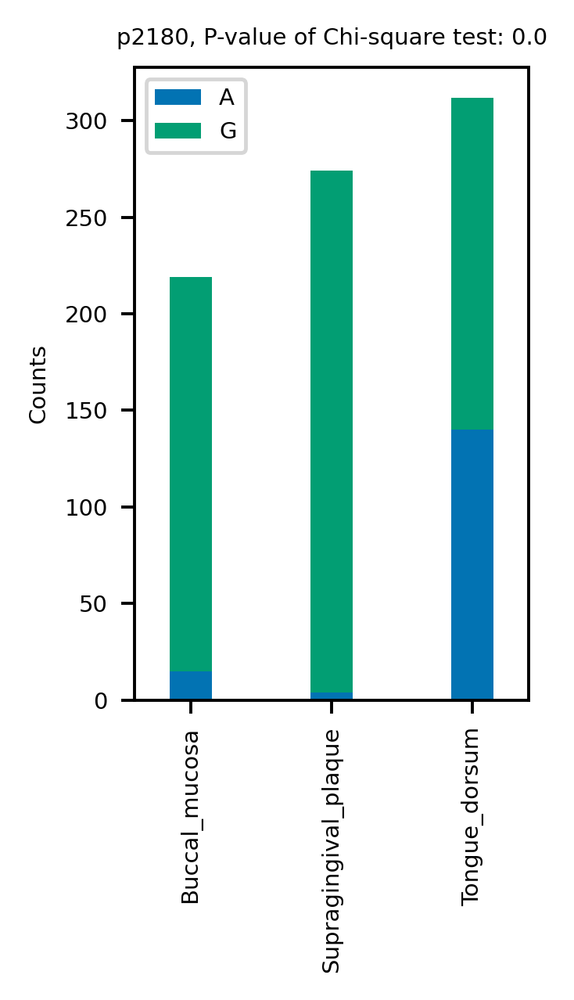

In [25]:
pl = plot_imp_all(final_models=top,
                  X_train=tr, y_train=y,
                  model_type = ana_type,
                  aggregate_function='max',
                  report_dir=report_dir, max_plots=150,
                  figsize=(1.86, 3))

In [26]:
# printing important positions with their importance values
positions = list(mean_imp.sort_values('mean', ascending=False)['feature'][:100])
importance = list(mean_imp.sort_values('mean', ascending=False)['mean'][:100].round(3))

ref_compare = None
ref_id = -1
compare_len = 30
imp_print(raw_seq, position=positions, importance=importance,
          ref_seq_id=ref_id, compare_with=ref_compare,
          compare_len=compare_len, report_dir=report_dir)

In [27]:
import joblib
load_gbc = joblib.load(report_dir+'/gbc.pkl')

In [28]:
load_gbc

Pipeline(memory='/Users/mbagh/Documents/RahLab/deepBreaks_data/hmp/s__Haemophilus_parainfluenzae_Body_site_2023-05-10_23-18-22',
         steps=[('prep',
                 Pipeline(steps=[('mc', MisCare(missing_threshold=0.05)),
                                 ('cc', ConstantCare()),
                                 ('ur', URareCare(threshold=0.05)),
                                 ('cc2', ConstantCare()),
                                 ('one_hot', CustomOneHotEncoder()),
                                 ('feature_selection',
                                  FeatureSelection(alpha=0.25, keep=True,
                                                   model_type='cl')),
                                 ('collinear_care',
                                  CollinearCare(dist_method='correlation',
                                                keep=True, threshold=0.25))])),
                ('gbc', GradientBoostingClassifier(random_state=123))])